# Library Installation

In [1]:
!pip install catboost
!pip install pandas-summary
!pip install optuna
!pip install pycaret
!pip install --upgrade numpy scikit-learn pycaret

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.5/144.5 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 362.8/362.8 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.2/233.2 kB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.6/50.6 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.1/486.1 kB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.8/21.8 MB 53.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 kB 6.1 MB/s eta 0:00:00
  

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import io as sio
import seaborn as sns
from sklearn.preprocessing import LabelBinarizer , StandardScaler ,MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report , accuracy_score,ConfusionMatrixDisplay
from xgboost import XGBClassifier, plot_importance
from sklearn.linear_model import LogisticRegression , RidgeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from numpy import absolute
from numpy import sqrt
from numpy import mean
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.utils import resample
from sklearn.ensemble import AdaBoostClassifier , GradientBoostingClassifier , VotingClassifier , RandomForestClassifier
import numpy as np
import pandas as pd
from pandas_summary import DataFrameSummary
import seaborn as sns
import matplotlib.pyplot as plt
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, VotingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
#from sklearn.inspection import plot_partial_dependence
#from sklearn.metrics import classification_report, recall_score, plot_confusion_matrix, plot_precision_recall_curve, roc_curve
from sklearn.metrics import log_loss,roc_auc_score,precision_score,f1_score,recall_score,roc_curve,auc
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix,accuracy_score,fbeta_score,matthews_corrcoef
#import matplotlib as mlp
#from matplotlib import Artist
#from matplotlib.artist import Artist
#import seaborn as sns
import warnings
import optuna
from optuna.samplers import TPESampler
from tqdm import tqdm
from pycaret.classification import *

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


# Loading data from Google Drive

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [51]:
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Obesity.csv')
data

,GD,AG,HT,WT,FH,FF,FV,NM,CM,SK,CW,CC,FA,TD,CA,TU,OB
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III


# Dataset Description

In [52]:
data.shape

(2111, 17)

In [53]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   GD      2111 non-null   object 
 1   AG      2111 non-null   float64
 2   HT      2111 non-null   float64
 3   WT      2111 non-null   float64
 4   FH      2111 non-null   object 
 5   FF      2111 non-null   object 
 6   FV      2111 non-null   float64
 7   NM      2111 non-null   float64
 8   CM      2111 non-null   object 
 9   SK      2111 non-null   object 
 10  CW      2111 non-null   float64
 11  CC      2111 non-null   object 
 12  FA      2111 non-null   float64
 13  TD      2111 non-null   float64
 14  CA      2111 non-null   object 
 15  TU      2111 non-null   object 
 16  OB      2111 non-null   object 
dtypes: float64(8), object(9)
memory usage: 280.5+ KB


In [54]:
data.describe()

,AG,HT,WT,FV,NM,CW,FA,TD
count,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000
mean,24.312600,1.701677,86.586058,2.419043,2.685628,2.008011,1.010298,0.657866
std,6.345968,0.093305,26.191172,0.533927,0.778039,0.612953,0.850592,0.608927
min,14.000000,1.450000,39.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,19.947192,1.630000,65.473343,2.000000,2.658738,1.584812,0.124505,0.000000
50%,22.777890,1.700499,83.000000,2.385502,3.000000,2.000000,1.000000,0.625350
75%,26.000000,1.768464,107.430682,3.000000,3.000000,2.477420,1.666678,1.000000
max,61.000000,1.980000,173.000000,3.000000,4.000000,3.000000,3.000000,2.000000


In [55]:
data.isnull().sum()

,0
GD,0
AG,0
HT,0
WT,0
FH,0
FF,0
FV,0
NM,0
CM,0
SK,0


No Null values found.

# Performing Cramer's V and Chi-Squared Test for find out the influence of Independent categorical variables on the depended variabl (OB).

In [56]:
import pandas as pd
from scipy.stats import chi2_contingency
from scipy.stats import chi2
import numpy as np

In [57]:
categorical_cols = ["GD", "FH", "FF", "CM", "SK", "CC", "CA", "TU"]

In [58]:
# Function to calculate Cramer's V
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    rcorr = r - ((r - 1)**2) / (n - 1)
    kcorr = k - ((k - 1)**2) / (n - 1)
    return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))

    # Perform Cramer's V and Chi-squared tests
for col in categorical_cols:
    contingency_table = pd.crosstab(data[col], data["OB"])

    # Calculate Cramer's V
    cramers = cramers_v(data[col], data["OB"])

    print(f"--- {col} vs OB ---")
    print(f"Cramer's V: {cramers}")

--- GD vs OB ---
Cramer's V: 0.5557726060500323
--- FH vs OB ---
Cramer's V: 0.5403074121245424
--- FF vs OB ---
Cramer's V: 0.3282428524018662
--- CM vs OB ---
Cramer's V: 0.35231440455622254
--- SK vs OB ---
Cramer's V: 0.11129354533978034
--- CC vs OB ---
Cramer's V: 0.23549995358437975
--- CA vs OB ---
Cramer's V: 0.22514638070103762
--- TU vs OB ---
Cramer's V: 0.1785158768663847


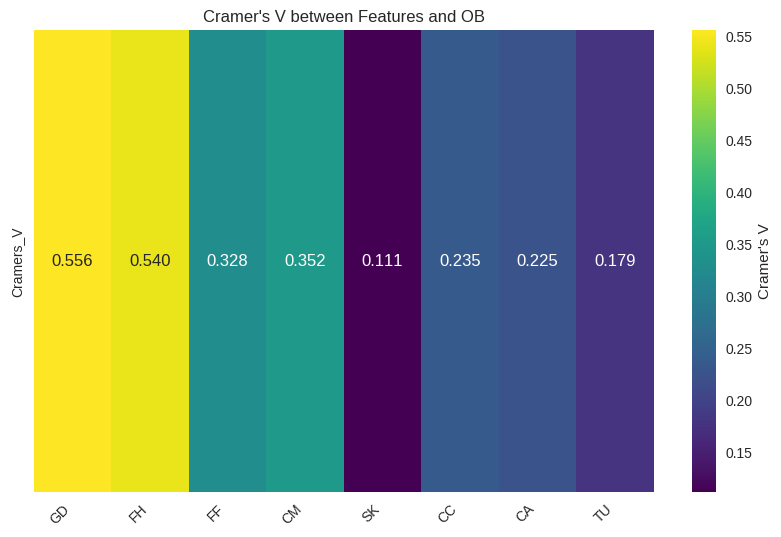

In [59]:
cramers_v_results = {}
for col in categorical_cols:
    contingency_table = pd.crosstab(data[col], data["OB"])

    # Calculate Cramer's V
    cramers = cramers_v(data[col], data["OB"])
    cramers_v_results[col] = cramers

# Convert the dictionary to a DataFrame
cramers_df = pd.DataFrame(list(cramers_v_results.items()), columns=['Feature', 'Cramers_V'])

# Create the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(cramers_df[['Cramers_V']].transpose(), annot=True, cmap='viridis', fmt=".3f",
            xticklabels=cramers_df['Feature'],
            cbar_kws={'label': 'Cramer\'s V'})
plt.title('Cramer\'s V between Features and OB')
plt.xticks(rotation=45, ha='right')
plt.show()

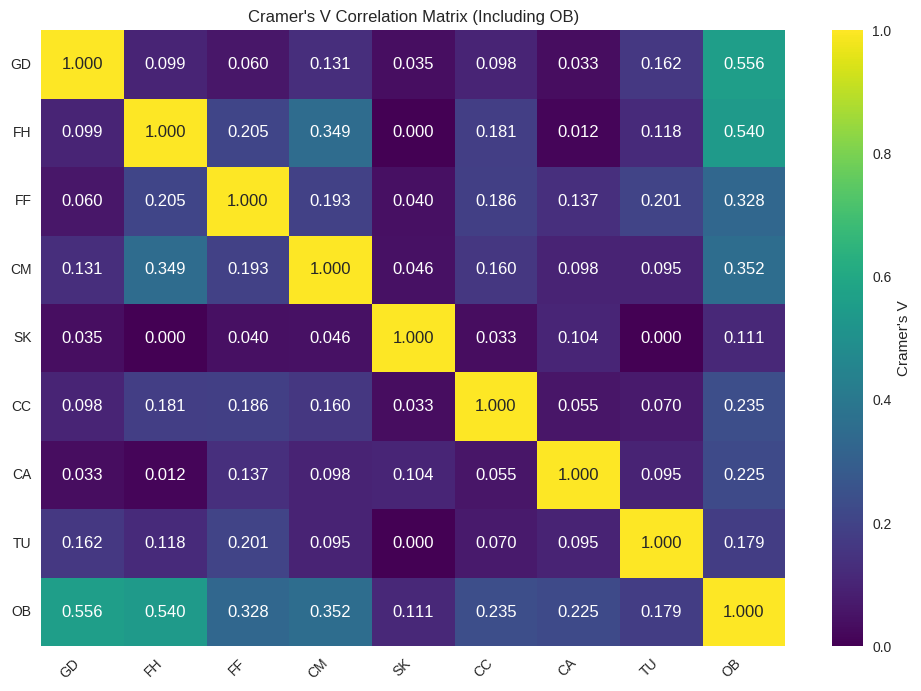

In [60]:
cramers_v_results = {}
for col in categorical_cols:
    cramers_v_results[col] = cramers_v(data[col], data["OB"])

cramers_df = pd.DataFrame(list(cramers_v_results.items()), columns=['Feature', 'Cramers_V'])

all_categorical_cols = categorical_cols + ['OB']

# Create an empty matrix for Cramer's V values
num_features = len(all_categorical_cols)
cramers_matrix = np.ones((num_features, num_features))

# Calculate Cramer's V for all pairs, including 'OB'
for i in range(num_features):
    for j in range(i + 1, num_features):
        cramers_matrix[i, j] = cramers_matrix[j, i] = cramers_v(data[all_categorical_cols[i]], data[all_categorical_cols[j]])

cramers_matrix_df = pd.DataFrame(cramers_matrix, index=all_categorical_cols, columns=all_categorical_cols)

plt.figure(figsize=(12, 8))
sns.heatmap(cramers_matrix_df, annot=True, cmap='viridis', fmt=".3f", cbar_kws={'label': 'Cramer\'s V'})
plt.title('Cramer\'s V Correlation Matrix (Including OB)')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.show()

In [61]:
# Perform tests for each feature
for feature in categorical_cols:
    # Chi-squared test
    contingency_table = pd.crosstab(data[feature], data['OB'])
    chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
    print(f"Chi-squared test for {feature} vs. OB:")
    print(f"  Chi2 Statistic: {chi2_stat:.3f}")
    print(f"  P-value: {p_value:.3f}")

    # Cramer's V (if association is significant)
    if p_value < 0.05:  # Adjust significance level as needed
        v = cramers_v(data[feature], data['OB'])
        print(f"  Cramer's V: {v:.3f}")
    print("-" * 30)  # Separator for clarity

Chi-squared test for GD vs. OB:
  Chi2 Statistic: 657.746
  P-value: 0.000
  Cramer's V: 0.556
------------------------------
Chi-squared test for FH vs. OB:
  Chi2 Statistic: 621.979
  P-value: 0.000
  Cramer's V: 0.540
------------------------------
Chi-squared test for FF vs. OB:
  Chi2 Statistic: 233.341
  P-value: 0.000
  Cramer's V: 0.328
------------------------------
Chi-squared test for CM vs. OB:
  Chi2 Statistic: 802.977
  P-value: 0.000
  Cramer's V: 0.352
------------------------------
Chi-squared test for SK vs. OB:
  Chi2 Statistic: 32.138
  P-value: 0.000
  Cramer's V: 0.111
------------------------------
Chi-squared test for CC vs. OB:
  Chi2 Statistic: 123.024
  P-value: 0.000
  Cramer's V: 0.235
------------------------------
Chi-squared test for CA vs. OB:
  Chi2 Statistic: 338.578
  P-value: 0.000
  Cramer's V: 0.225
------------------------------
Chi-squared test for TU vs. OB:
  Chi2 Statistic: 292.594
  P-value: 0.000
  Cramer's V: 0.179
------------------------

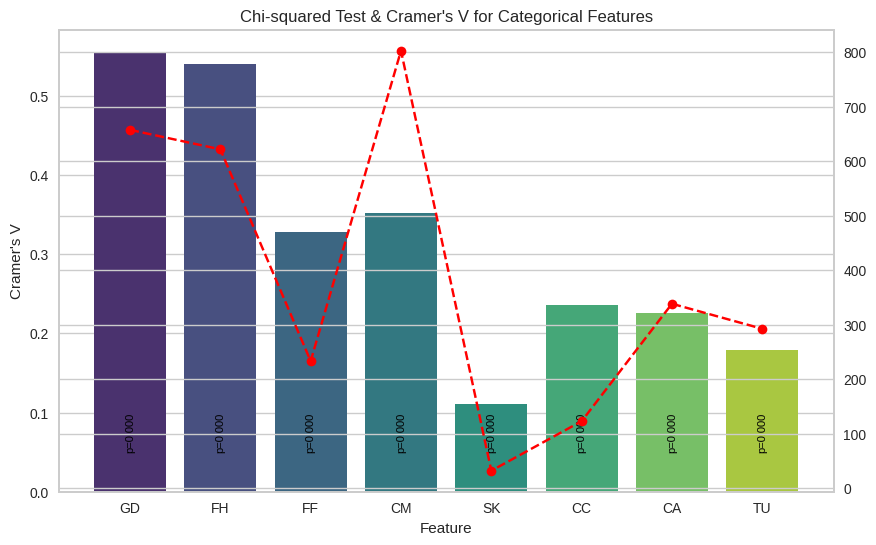

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency

def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    rcorr = r - ((r - 1)**2) / (n - 1)
    kcorr = k - ((k - 1)**2) / (n - 1)
    return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))

results = []
for col in categorical_cols:
    contingency_table = pd.crosstab(data[col], data["OB"])
    chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
    cramers = cramers_v(data[col], data["OB"])
    results.append([col, chi2_stat, p_value, cramers])

results_df = pd.DataFrame(results, columns=['Feature', 'Chi2 Statistic', 'P-value', "Cramer's V"])

plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Feature', y="Cramer's V", data=results_df, palette="viridis")
ax2 = ax.twinx()
ax2.plot(results_df['Feature'], results_df['Chi2 Statistic'], color='red', marker='o', linestyle='--')


plt.title('Chi-squared Test & Cramer\'s V for Categorical Features')
plt.xticks(rotation=45, ha='right')

# Annotate with p-values
for i, p in enumerate(results_df['P-value']):
  ax.text(i, 0.05, f"p={p:.3f}", ha='center', va='bottom', rotation=90, fontsize=8, color="black")

plt.show()

The red line denotes Chi Squared Test

# Finding distinct values in categorical data to label encode them.

In [63]:
# Identify categorical features and their distinct values for label encoding
categorical_features = data.select_dtypes(include=['object']).columns
for col in categorical_features:
    distinct_values = data[col].unique()
    print(f"Feature: {col}")
    print(f"  Number of distinct values: {len(distinct_values)}")
    print(f"  Distinct values: {distinct_values}")

Feature: GD
  Number of distinct values: 2
  Distinct values: ['Female' 'Male']
Feature: FH
  Number of distinct values: 2
  Distinct values: ['yes' 'no']
Feature: FF
  Number of distinct values: 2
  Distinct values: ['no' 'yes']
Feature: CM
  Number of distinct values: 4
  Distinct values: ['Sometimes' 'Frequently' 'Always' 'no']
Feature: SK
  Number of distinct values: 2
  Distinct values: ['no' 'yes']
Feature: CC
  Number of distinct values: 2
  Distinct values: ['no' 'yes']
Feature: CA
  Number of distinct values: 4
  Distinct values: ['no' 'Sometimes' 'Frequently' 'Always']
Feature: TU
  Number of distinct values: 5
  Distinct values: ['Public_Transportation' 'Walking' 'Automobile' 'Motorbike' 'Bike']
Feature: OB
  Number of distinct values: 7
  Distinct values: ['Normal_Weight' 'Overweight_Level_I' 'Overweight_Level_II'
 'Obesity_Type_I' 'Insufficient_Weight' 'Obesity_Type_II'
 'Obesity_Type_III']


# Label Encoding

In [64]:
# Label encode 'gender'
data['GD'] = data['GD'].replace({'Male': 1, 'Female': 0})

In [65]:
# Mapping for label encoding
label_mapping = {'no': 0, 'yes': 1}
for feature in ['FH', 'FF', 'SK', 'CC']:
    data[feature] = data[feature].map(label_mapping)

In [66]:
# Mapping for label encoding
label_mapping = {'no': 0, 'Sometimes': 1, 'Frequently': 2, 'Always': 4}
for feature in ['CM', 'CA']:
    data[feature] = data[feature].map(label_mapping)

In [67]:
# Mapping for label encoding 'TU'
label_mapping = {'Public_Transportation':1, 'Walking':0, 'Automobile':4,'Motorbike':2, 'Bike':3}
data['TU'] = data['TU'].map(label_mapping)

In [68]:
# Mapping for label encoding 'OB'
label_mapping = {'Normal_Weight': 1, 'Overweight_Level_I': 5, 'Overweight_Level_II': 6,
                 'Obesity_Type_I': 2, 'Insufficient_Weight': 0, 'Obesity_Type_II': 3,
                 'Obesity_Type_III': 4}
data['OB'] = data['OB'].map(label_mapping)

In [69]:
data

,GD,AG,HT,WT,FH,FF,FV,NM,CM,SK,CW,CC,FA,TD,CA,TU,OB
0,0,21.000000,1.620000,64.000000,1,0,2.0,3.0,1,0,2.000000,0,0.000000,1.000000,0,1,1
1,0,21.000000,1.520000,56.000000,1,0,3.0,3.0,1,1,3.000000,1,3.000000,0.000000,1,1,1
2,1,23.000000,1.800000,77.000000,1,0,2.0,3.0,1,0,2.000000,0,2.000000,1.000000,2,1,1
3,1,27.000000,1.800000,87.000000,0,0,3.0,3.0,1,0,2.000000,0,2.000000,0.000000,2,0,5
4,1,22.000000,1.780000,89.800000,0,0,2.0,1.0,1,0,2.000000,0,0.000000,0.000000,1,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,0,20.976842,1.710730,131.408528,1,1,3.0,3.0,1,0,1.728139,0,1.676269,0.906247,1,1,4
2107,0,21.982942,1.748584,133.742943,1,1,3.0,3.0,1,0,2.005130,0,1.341390,0.599270,1,1,4
2108,0,22.524036,1.752206,133.689352,1,1,3.0,3.0,1,0,2.054193,0,1.414209,0.646288,1,1,4
2109,0,24.361936,1.739450,133.346641,1,1,3.0,3.0,1,0,2.852339,0,1.139107,0.586035,1,1,4


,0
GD,"Axes(0.125,0.77;0.168478x0.11)"
AG,"Axes(0.327174,0.77;0.168478x0.11)"
HT,"Axes(0.529348,0.77;0.168478x0.11)"
WT,"Axes(0.731522,0.77;0.168478x0.11)"
FH,"Axes(0.125,0.638;0.168478x0.11)"
FF,"Axes(0.327174,0.638;0.168478x0.11)"
FV,"Axes(0.529348,0.638;0.168478x0.11)"
NM,"Axes(0.731522,0.638;0.168478x0.11)"
CM,"Axes(0.125,0.506;0.168478x0.11)"
SK,"Axes(0.327174,0.506;0.168478x0.11)"


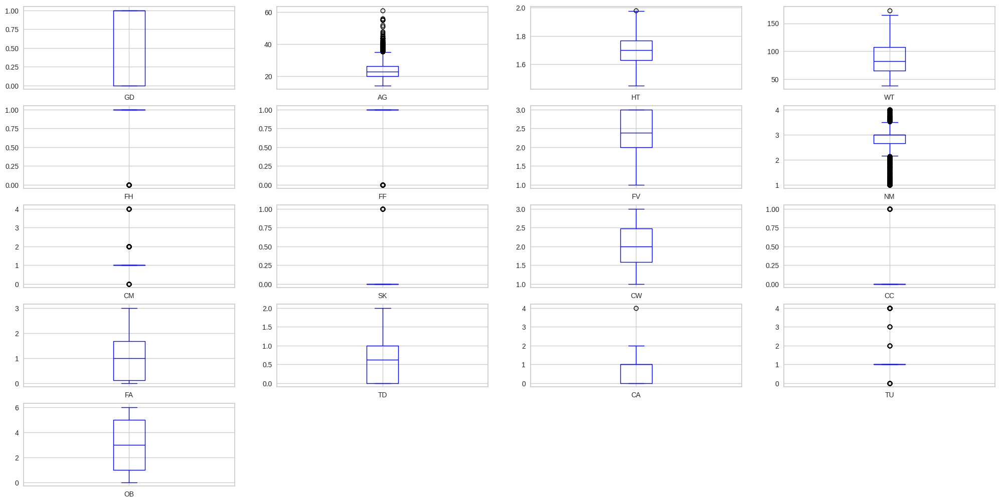

In [36]:
data.plot(color='blue', kind='box', figsize=(25, 15), subplots=True, layout=(6, 4))
#plt.show()

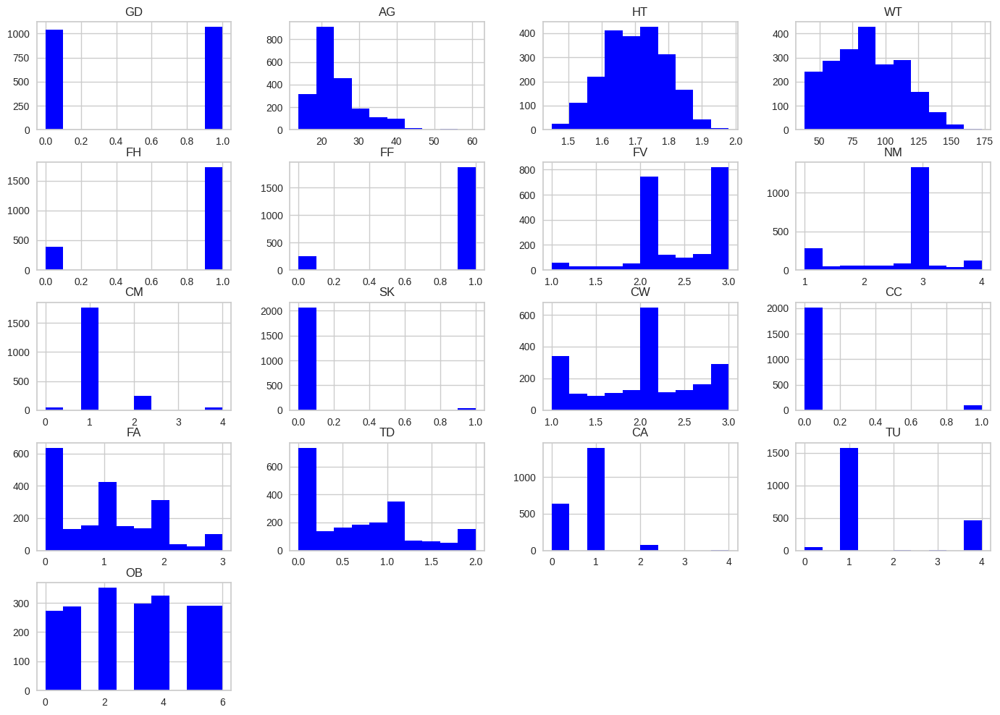

In [37]:
#histogram
data.hist(color='blue',bins=10,figsize=(17,12))
plt.show()

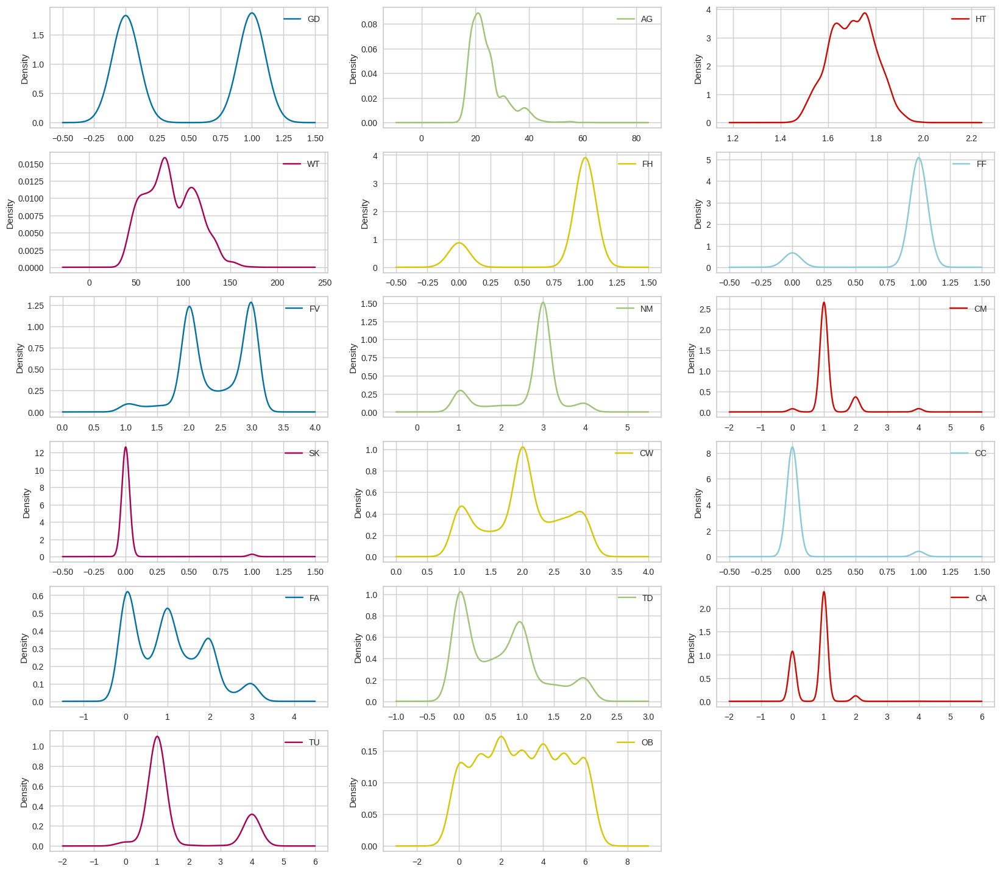

In [38]:
#Boxplot of each column
data.plot( kind='density', figsize=(20,18), subplots=True, layout=(6,3),sharex=False)
plt.show()

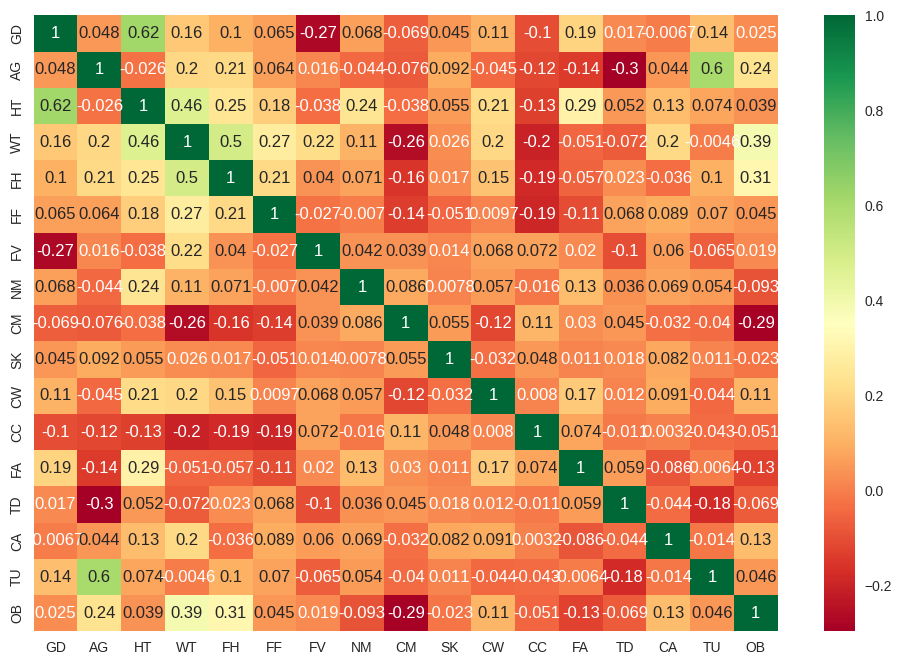

In [39]:
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(12,8))
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

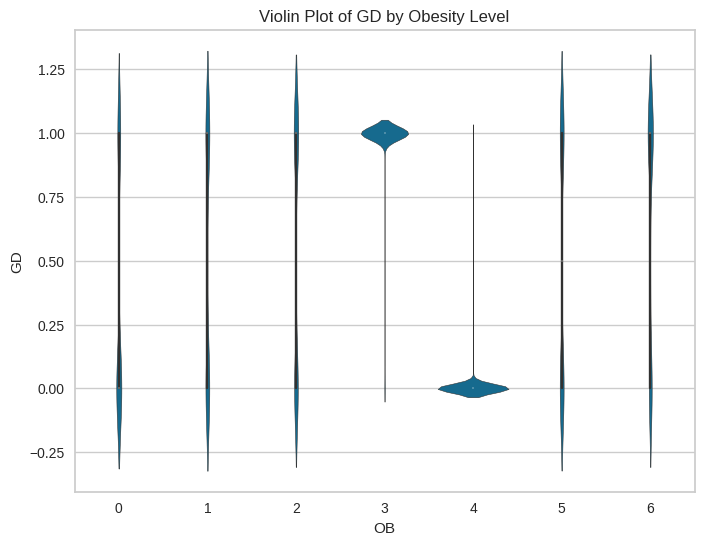

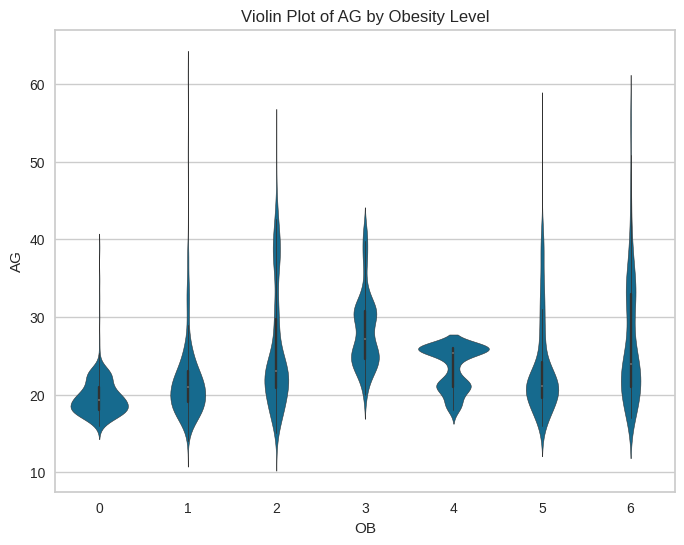

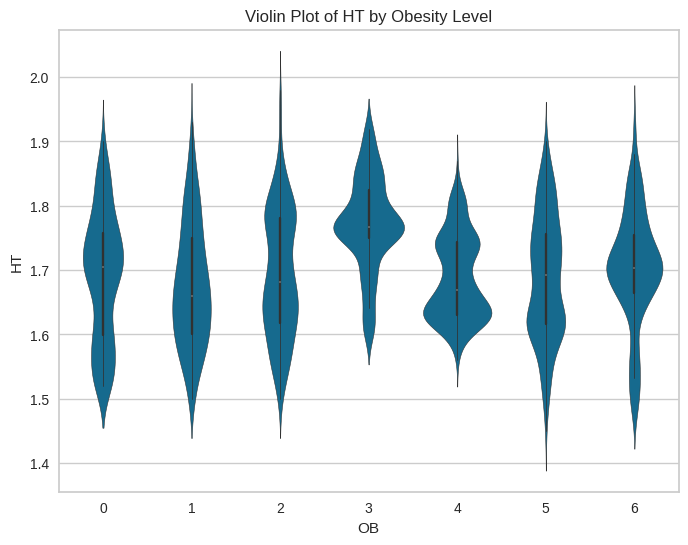

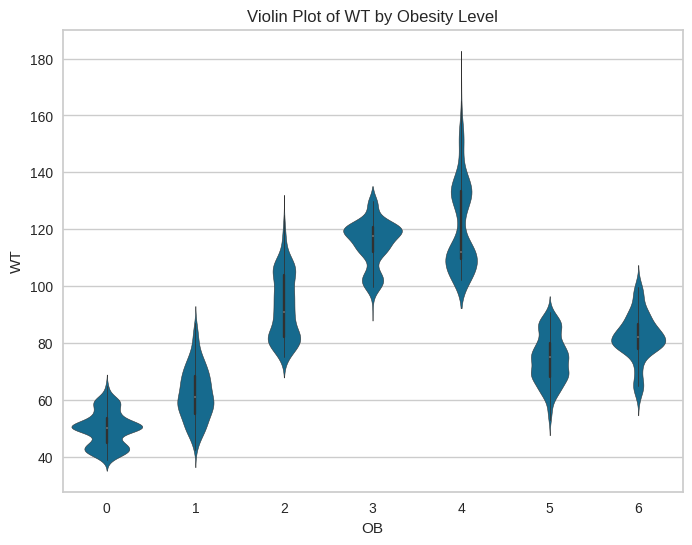

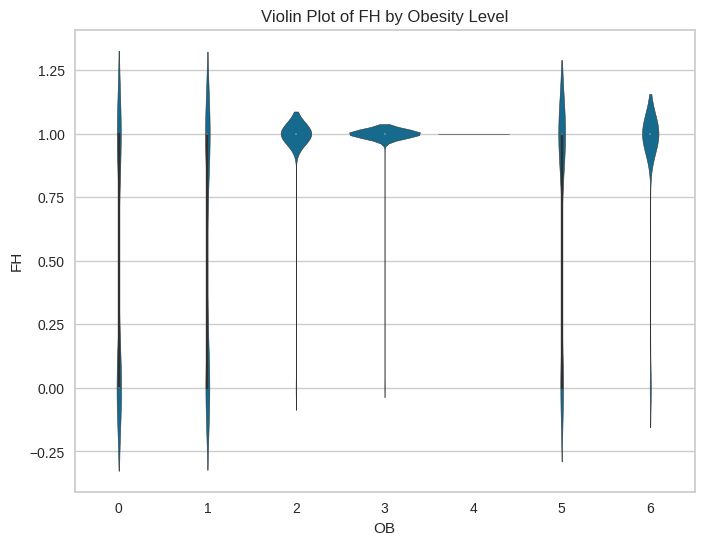

...

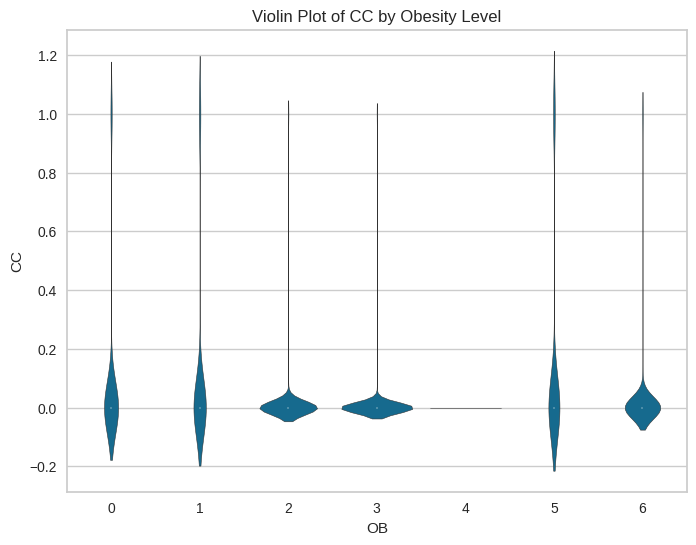

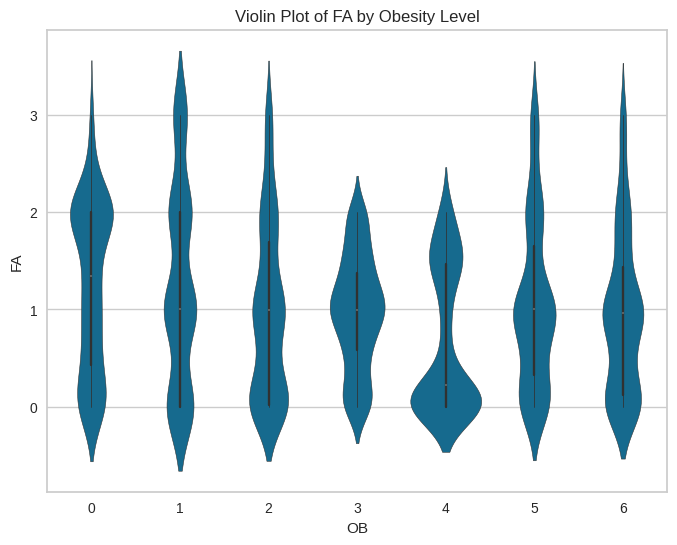

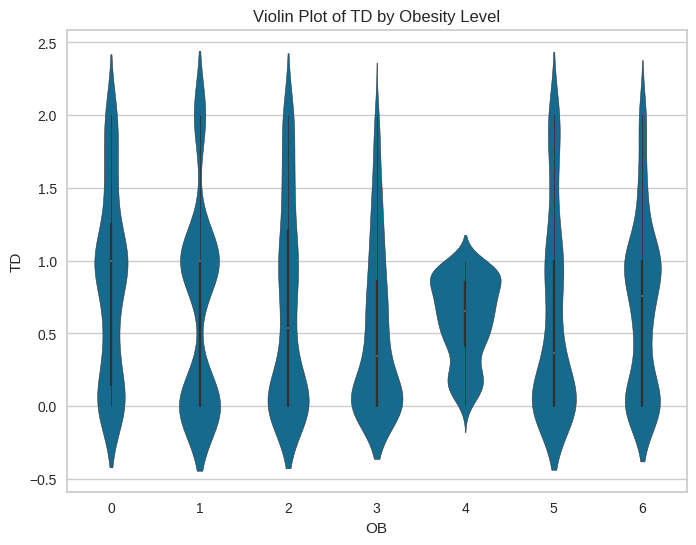

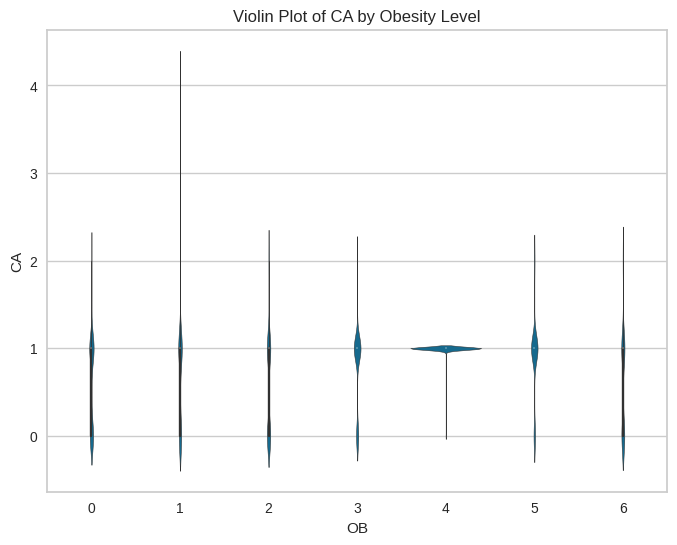

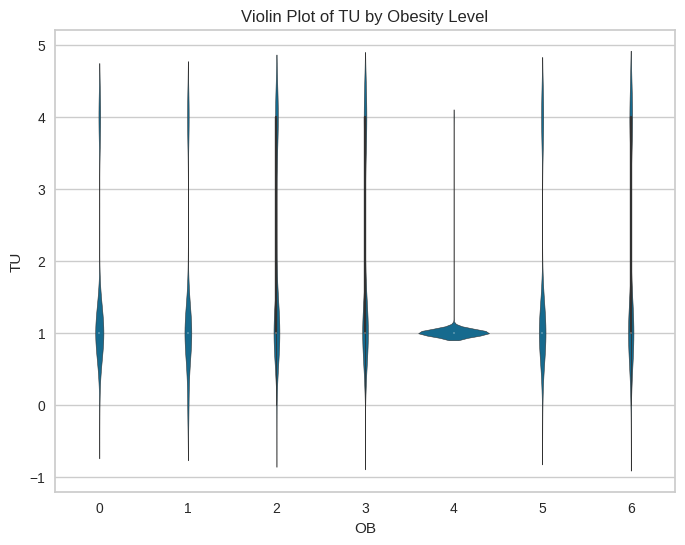

In [42]:
# Violin plots to show the distribution of numerical features for each obesity level
for col in data.select_dtypes(include=['number']).columns:
  if col != 'OB':  # Exclude the target variable itself
    plt.figure(figsize=(8, 6))
    sns.violinplot(x='OB', y=col, data=data)
    plt.title(f'Violin Plot of {col} by Obesity Level')
    plt.show()

### Outliers handling using IQR method

In [70]:
#checking for the out layers with STD
print("Highest allowed",data['AG'].mean() + 3*data['AG'].std())
print("Lowest allowed",data['AG'].mean() - 3*data['AG'].std())

Highest allowed 43.35050472977086
Lowest allowed 5.274695087377413


In [71]:
#dealing with out layer values
data[(data['AG'] > 35) | (data['AG'] < 5.274)]

,GD,AG,HT,WT,FH,FF,FV,NM,CM,SK,CW,CC,FA,TD,CA,TU,OB
13,1,41.000000,1.800000,99.000000,0,1,2.000000,3.000000,1,0,2.000000,0,2.000000,1.00000,2,4,2
21,0,52.000000,1.690000,87.000000,1,1,3.000000,1.000000,1,1,2.000000,0,0.000000,0.00000,0,4,2
33,1,39.000000,1.790000,90.000000,0,0,2.000000,1.000000,1,0,2.000000,0,0.000000,0.00000,1,1,6
92,1,55.000000,1.780000,84.000000,1,0,3.000000,4.000000,2,0,3.000000,1,3.000000,0.00000,2,0,5
104,0,38.000000,1.560000,80.000000,1,1,2.000000,3.000000,1,0,2.000000,0,0.000000,0.00000,1,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1740,1,37.765356,1.763582,117.861590,1,1,2.145114,2.888193,1,0,2.038128,0,0.852344,0.00000,1,4,3
1775,1,37.207082,1.762921,118.401740,1,1,2.136830,2.993084,1,0,1.885926,0,0.615298,0.00000,1,4,3
1776,1,38.108940,1.752863,119.201465,1,1,2.499388,2.989791,1,0,1.959777,0,0.608100,0.64676,1,4,3
1777,1,38.644441,1.768235,117.792268,1,1,2.230742,2.920373,1,0,1.831187,0,0.756277,0.00000,1,4,3


In [72]:
new_df = data[(data['AG'] <35) & (data['AG'] >5.274)]
new_df

,GD,AG,HT,WT,FH,FF,FV,NM,CM,SK,CW,CC,FA,TD,CA,TU,OB
0,0,21.000000,1.620000,64.000000,1,0,2.0,3.0,1,0,2.000000,0,0.000000,1.000000,0,1,1
1,0,21.000000,1.520000,56.000000,1,0,3.0,3.0,1,1,3.000000,1,3.000000,0.000000,1,1,1
2,1,23.000000,1.800000,77.000000,1,0,2.0,3.0,1,0,2.000000,0,2.000000,1.000000,2,1,1
3,1,27.000000,1.800000,87.000000,0,0,3.0,3.0,1,0,2.000000,0,2.000000,0.000000,2,0,5
4,1,22.000000,1.780000,89.800000,0,0,2.0,1.0,1,0,2.000000,0,0.000000,0.000000,1,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,0,20.976842,1.710730,131.408528,1,1,3.0,3.0,1,0,1.728139,0,1.676269,0.906247,1,1,4
2107,0,21.982942,1.748584,133.742943,1,1,3.0,3.0,1,0,2.005130,0,1.341390,0.599270,1,1,4
2108,0,22.524036,1.752206,133.689352,1,1,3.0,3.0,1,0,2.054193,0,1.414209,0.646288,1,1,4
2109,0,24.361936,1.739450,133.346641,1,1,3.0,3.0,1,0,2.852339,0,1.139107,0.586035,1,1,4


In [73]:
#storing the values
upper_limit = data['AG'].mean() + 3*data['AG'].std()
lower_limit = data['AG'].mean() - 3*data['AG'].std()

In [74]:
data['AG'] = np.where(
    data['AG']>upper_limit,
    upper_limit,
    np.where(
        data['AG']<lower_limit,
        lower_limit,
        data['AG']
    )
)

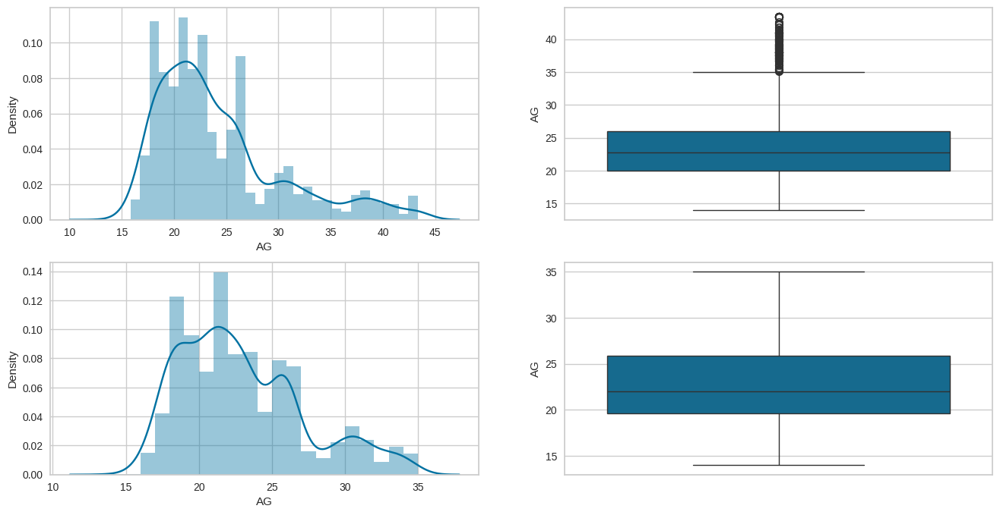

In [75]:
#ploting the outlayer removing
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.distplot(data['AG'])
plt.subplot(2,2,2)
sns.boxplot(data['AG'])
plt.subplot(2,2,3)
sns.distplot(new_df['AG'])
plt.subplot(2,2,4)
sns.boxplot(new_df['AG'])
plt.show()

In [76]:
#checking for the out layers with STD
print("Highest allowed",data['NM'].mean() + 3*data['NM'].std())
print("Lowest allowed",data['NM'].mean() - 3*data['NM'].std())

Highest allowed 5.019743996265038
Lowest allowed 0.3515121032138815


In [77]:
#dealing with out layer values
data[(data['NM'] >3.5) | (data['NM'] < 1.664)]

,GD,AG,HT,WT,FH,FF,FV,NM,CM,SK,CW,CC,FA,TD,CA,TU,OB
4,1,22.000000,1.780000,89.800000,0,0,2.000000,1.000000,1,0,2.000000,0,0.000000,0.000000,1,1,6
14,1,23.000000,1.770000,60.000000,1,1,3.000000,1.000000,1,0,1.000000,0,1.000000,1.000000,1,1,1
16,1,27.000000,1.930000,102.000000,1,1,2.000000,1.000000,1,0,1.000000,0,1.000000,0.000000,1,1,6
17,0,29.000000,1.530000,78.000000,0,1,2.000000,1.000000,1,0,2.000000,0,0.000000,0.000000,0,4,2
18,0,30.000000,1.710000,82.000000,1,1,3.000000,4.000000,2,1,1.000000,0,0.000000,0.000000,0,4,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1780,1,26.624342,1.690262,103.180918,1,1,2.649406,1.120102,1,0,1.153286,0,0.216908,0.619012,0,1,3
1795,1,20.068432,1.657132,105.580491,1,1,2.724121,1.437959,1,0,1.590418,0,0.029603,1.122118,0,1,3
1796,1,20.914366,1.644751,101.067988,1,1,2.801992,1.343117,1,0,1.128942,0,0.233987,0.819980,0,1,3
1797,1,25.512048,1.660761,104.321463,1,1,2.748971,1.213431,1,0,1.448875,0,0.128548,1.239038,0,1,3


In [78]:
new_df = data[(data['NM'] <2.2) & (data['NM'] >1.664)]
new_df

,GD,AG,HT,WT,FH,FF,FV,NM,CM,SK,CW,CC,FA,TD,CA,TU,OB
513,0,21.243142,1.598019,44.845655,0,0,3.000000,1.726260,2,0,2.444125,0,1.318170,0.000000,0,1,0
516,0,21.491055,1.586952,43.087508,0,0,2.008760,1.737620,2,0,1.792022,0,0.119643,0.000000,0,1,0
520,0,19.000000,1.556211,42.339767,0,1,3.000000,2.084600,1,0,2.137550,1,0.196152,0.062488,0,1,0
521,0,19.000000,1.564199,42.096062,0,1,3.000000,1.894384,1,0,2.456581,1,1.596576,0.997400,0,1,0
552,1,17.038222,1.710564,51.588874,0,1,2.000000,2.057935,1,0,2.371015,0,0.288032,0.714627,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1781,1,33.722449,1.712905,103.276087,1,1,2.525884,2.040582,1,0,1.000000,0,1.670360,0.023959,0,1,3
1782,1,32.516469,1.695735,102.784864,1,1,2.736647,2.015675,1,0,1.000000,0,1.977918,0.056351,0,1,3
1791,1,24.001889,1.614075,100.245302,1,1,2.880483,1.703299,1,0,1.006378,0,1.076729,1.058007,0,1,3
1792,1,24.002404,1.609418,100.078367,1,1,2.885693,1.685134,1,0,1.011849,0,0.503105,1.217929,0,1,3


In [79]:
#storing the values
upper_limit = data['NM'].mean() + 3*data['NM'].std()
lower_limit = data['NM'].mean() - 3*data['NM'].std()

In [80]:
data['NM'] = np.where(
    data['NM']>upper_limit,
    upper_limit,
    np.where(
        data['NM']<lower_limit,
        lower_limit,
        data['NM']
    )
)

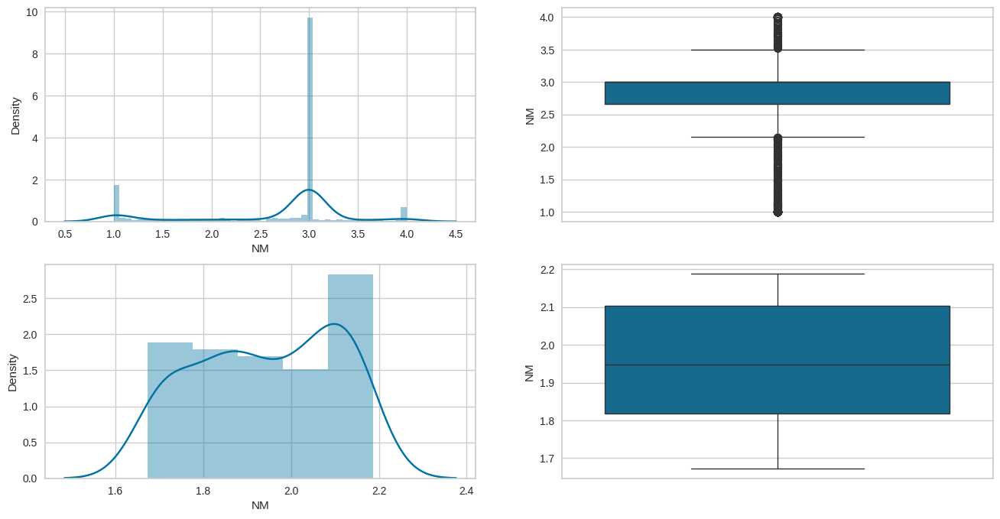

In [81]:
#ploting the outlayer removing
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.distplot(data['NM'])
plt.subplot(2,2,2)
sns.boxplot(data['NM'])
plt.subplot(2,2,3)
sns.distplot(new_df['NM'])
plt.subplot(2,2,4)
sns.boxplot(new_df['NM'])
plt.show()

<Axes: >

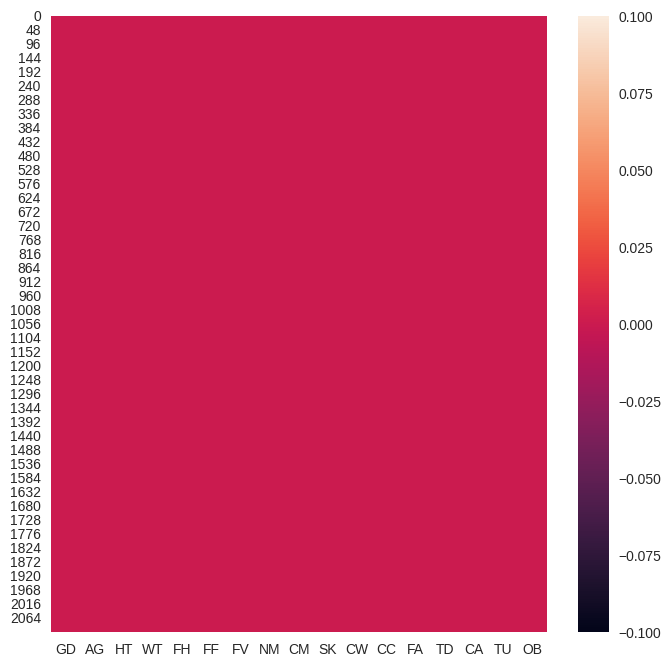

In [82]:
plt.figure(figsize=(8,8))
sns.heatmap(data.isnull())

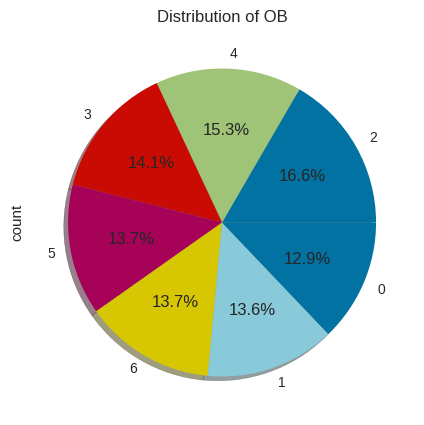

In [ ]:
ob_series = pd.Series(data['OB'])
# Plot the pie chart
plt.figure(figsize=(15, 5))
data['OB'].value_counts().plot.pie(explode=None, autopct='%1.1f%%', shadow=True)
plt.title('Distribution of OB')
plt.show()

In [83]:
#check the group by values
data['OB'].value_counts()

,count
OB,
2,351
4,324
3,297
5,290
6,290
1,287
0,272


In [87]:
features_to_scale = [col for col in data.columns if col != 'OB']
scaler = StandardScaler()
data[features_to_scale] = scaler.fit_transform(data[features_to_scale])

In [89]:
data.head()

,GD,AG,HT,WT,FH,FF,FV,NM,CM,SK,CW,CC,FA,TD,CA,TU,OB
0,-1.011914,-0.532954,-0.875589,-0.862558,0.472291,-2.759769,-0.785019,0.404153,-0.285491,-0.145900,-0.013073,-0.218272,-1.188039,0.561997,-1.413131,-0.503337,1
1,-1.011914,-0.532954,-1.947599,-1.168077,0.472291,-2.759769,1.088342,0.404153,-0.285491,6.853997,1.618759,4.581439,2.339750,-1.080625,0.517691,-0.503337,1
2,0.988227,-0.204910,1.054029,-0.366090,0.472291,-2.759769,-0.785019,0.404153,-0.285491,-0.145900,-0.013073,-0.218272,1.163820,0.561997,2.448512,-0.503337,1
3,0.988227,0.451178,1.054029,0.015808,-2.117337,-2.759769,1.088342,0.404153,-0.285491,-0.145900,-0.013073,-0.218272,1.163820,-1.080625,2.448512,-1.296280,5
4,0.988227,-0.368932,0.839627,0.122740,-2.117337,-2.759769,-0.785019,-2.167023,-0.285491,-0.145900,-0.013073,-0.218272,-1.188039,-1.080625,0.517691,-0.503337,6


# Implementing PyCaret

In [90]:
numeric_features = [col for col in data.columns if data[col].dtype in [np.int64, np.float64] and col not in ['GD', 'OB']]
print(numeric_features)

['AG', 'HT', 'WT', 'FH', 'FF', 'FV', 'NM', 'CM', 'SK', 'CW', 'CC', 'FA', 'TD', 'CA', 'TU']


In [91]:
from pycaret.classification import *
clf_setup = setup(data=data,
                  target='OB',
                  session_id=42,
                  preprocess=True,
                  normalize=True,
                  transformation=True,
                  numeric_features = numeric_features,
                  categorical_features =  ['GD'],
                  index=False,
                  verbose=True)

,Description,Value
0,Session id,42
1,Target,OB
2,Target type,Multiclass
3,Original data shape,"(2111, 17)"
4,Transformed data shape,"(2111, 17)"
5,Transformed train set shape,"(1477, 17)"
6,Transformed test set shape,"(634, 17)"
7,Numeric features,15
8,Categorical features,1
9,Preprocess,True


In [92]:
print('comparing models for Obesity data and selecting top 5 out of them based on accuracy score')
top_model = compare_models(n_select = 5, sort='Accuracy')

comparing models for Obesity data and selecting top 5 out of them based on accuracy score


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9702,0.9990,0.9702,0.9717,0.9699,0.9652,0.9655,3.2590
xgboost,Extreme Gradient Boosting,0.9668,0.9985,0.9668,0.9691,0.9666,0.9612,0.9617,0.4100
catboost,CatBoost Classifier,0.9655,0.9990,0.9655,0.9675,0.9652,0.9597,0.9601,16.3240
gbc,Gradient Boosting Classifier,0.9587,0.0000,0.9587,0.9605,0.9580,0.9517,0.9523,2.9020
rf,Random Forest Classifier,0.9519,0.9973,0.9519,0.9563,0.9521,0.9439,0.9445,0.8390
et,Extra Trees Classifier,0.9452,0.9951,0.9452,0.9482,0.9454,0.9359,0.9364,0.3640
dt,Decision Tree Classifier,0.9188,0.9527,0.9188,0.9206,0.9184,0.9051,0.9055,0.2650
lda,Linear Discriminant Analysis,0.9127,0.0000,0.9127,0.9193,0.9121,0.8980,0.8993,0.2160
lr,Logistic Regression,0.8754,0.0000,0.8754,0.8802,0.8734,0.8545,0.8560,0.9110
knn,K Neighbors Classifier,0.7948,0.9438,0.7948,0.7885,0.7825,0.7603,0.7634,0.2180


Processing:   0%|          | 0/73 [00:00<?, ?it/s]

In [93]:
print("Top 5 Models are:")
for model in top_model:
  print(type(model).__name__)

Top 5 Models are:
LGBMClassifier
XGBClassifier
CatBoostClassifier
GradientBoostingClassifier
RandomForestClassifier


In [94]:
# Create a stacked ensemble model
stacker = stack_models(estimator_list=top_model, meta_model=XGBClassifier(), fold=10, method='auto')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9459,0.9910,0.9459,0.9474,0.9454,0.9369,0.9373
1,0.9797,0.9992,0.9797,0.9804,0.9799,0.9763,0.9764
2,0.9730,0.9990,0.9730,0.9744,0.9733,0.9684,0.9686
3,0.9865,0.9997,0.9865,0.9871,0.9863,0.9842,0.9844
4,0.9865,0.9999,0.9865,0.9871,0.9865,0.9842,0.9843
5,0.9797,0.9995,0.9797,0.9803,0.9797,0.9763,0.9764
6,0.9797,0.9999,0.9797,0.9812,0.9797,0.9763,0.9766
7,0.9592,0.9901,0.9592,0.9593,0.9584,0.9523,0.9526
8,0.9864,1.0000,0.9864,0.9876,0.9864,0.9841,0.9843


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

In [95]:
# Evaluate the stacker model
print(stacker)
evaluate_model(stacker)

StackingClassifier(cv=5,
                   estimators=[('Light Gradient Boosting Machine',
                                LGBMClassifier(boosting_type='gbdt',
                                               class_weight=None,
                                               colsample_bytree=1.0,
                                               importance_type='split',
                                               learning_rate=0.1, max_depth=-1,
                                               min_child_samples=20,
                                               min_child_weight=0.001,
                                               min_split_gain=0.0,
                                               n_estimators=100, n_jobs=-1,
                                               num_leaves=31, objective=None,
                                               random_state=42, reg_alpha=0.0,
                                               reg...
                                                 learning_

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [96]:
# Finalize the stacker model
final_stacker = finalize_model(stacker)
final_stacker

Pipeline(memory=Memory(location=None),
         steps=[('numerical_imputer',
                 TransformerWrapper(exclude=None,
                                    include=['AG', 'HT', 'WT', 'FH', 'FF', 'FV',
                                             'NM', 'CM', 'SK', 'CW', 'CC', 'FA',
                                             'TD', 'CA', 'TU'],
                                    transformer=SimpleImputer(add_indicator=False,
                                                              copy=True,
                                                              fill_value=None,
                                                              keep_empty_features=False,
                                                              missing_values=nan,
                                                              strategy='mean'))),
                ('categorical_imputer',
                 Transfor...
                                                                  max_bin=None,
                                                                  max_cat_threshold=None,
                                                                  max_cat_to_onehot=None,
                                                                  max_delta_step=None,
                                                                  max_depth=None,
                                                                  max_leaves=None,
                                                                  min_child_weight=None,
                                                                  missing=nan,
                                                                  monotone_constraints=None,
                                                                  multi_strategy=None,
                                                                  n_estimators=None,
                                                                  n_jobs=None,
                                                                  num_parallel_tree=None,
                                                                  objective='binary:logistic', ...),
                                    n_jobs=-1, passthrough=False,
                                    stack_method='auto', verbose=0))],
         verbose=False)

## Implementing SHAP XAI Shapley Additive exPlanations

In [98]:
!pip install shap
import shap

In [102]:
X = data.drop('OB', axis=1)
y = data['OB']

In [103]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [105]:
# Explain the model's predictions using SHAP
explainer = shap.Explainer(final_stacker.predict, X_train)
shap_values = explainer(X_test)

PermutationExplainer explainer: 424it [28:11,  4.00s/it]


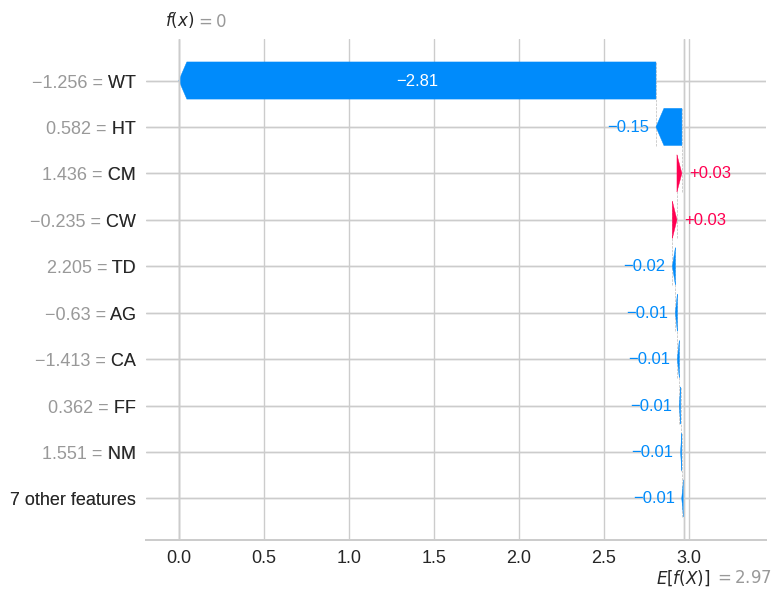

In [106]:
# Visualize the first prediction's explanation
shap.plots.waterfall(shap_values[0])

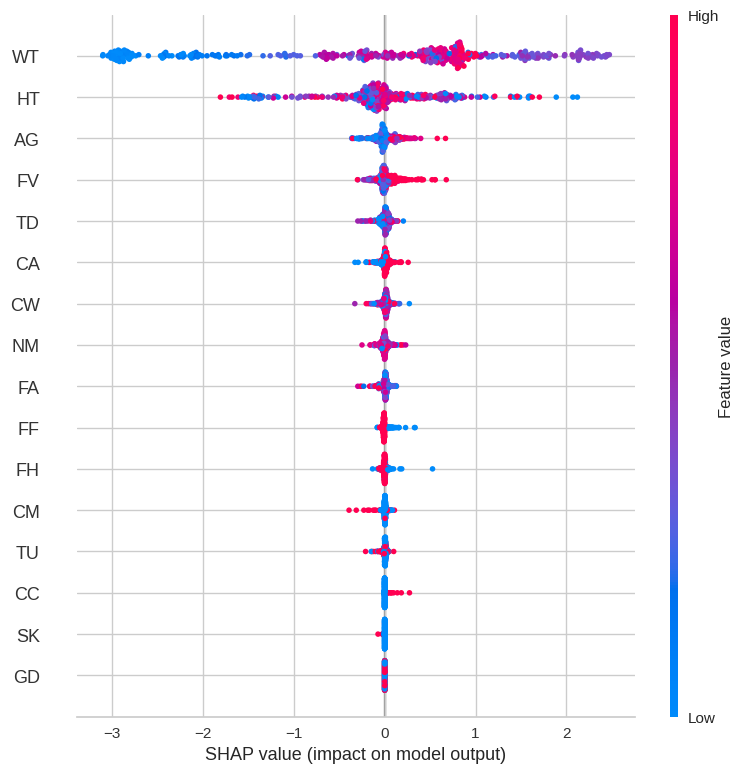

In [107]:
# Visualize the SHAP values for all features
shap.summary_plot(shap_values, X_test)

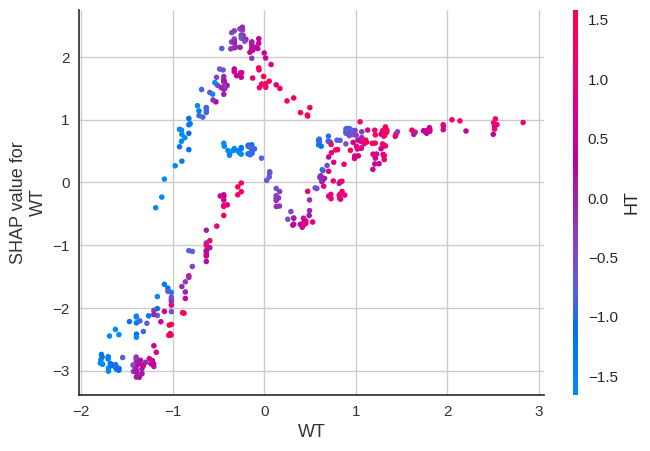

In [110]:
# Visualize the SHAP values for a specific feature
shap.dependence_plot("WT", shap_values.values, X_test)

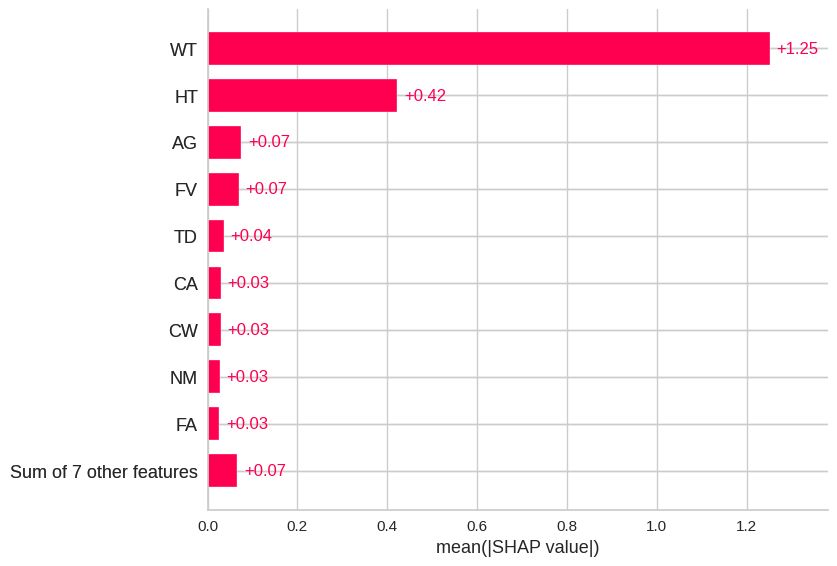

In [112]:
shap.plots.bar(shap_values)

## LIME Local  Interpretable Model-agnostic Explanations

In [114]:
!pip install lime

import lime
import lime.lime_tabular

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=72331aaf3c60be3c25e954f6bb2792942b3ae457ef9087d9479f75000aef4109
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [156]:
# Create a LimeTabularExplainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    X.values,  # Use the NumPy array representation of X
    feature_names=X.columns.tolist(), # Feature names for interpretability
    class_names=['Normal_Weight', 'Insufficient_Weight'], # Class names
    mode='classification' # or 'regression' depending on the task
)

In [157]:
# Choose an instance to explain
instance_index = 5 # Example: explain the first instance
instance = X.iloc[instance_index]

In [158]:
# Explain the instance
explanation = explainer.explain_instance(
    instance.values,
    lambda x: final_stacker.predict_proba(pd.DataFrame(x, columns=X.columns)), # Use a lambda function to wrap the prediction
    num_features=15  # Number of features to show in explanation
)

In [159]:
# Show the explanation
explanation.show_in_notebook(show_table=True)

In [160]:
explanation.as_list()

[('WT <= -0.81', 0.12194586440428534),
 ('FV <= -0.79', 0.041271470025979515),
 ('HT <= -0.77', -0.033987418585013605),
 ('FA <= -1.04', -0.029061856851522974),
 ('SK <= -0.15', 0.026546212450138534),
 ('AG > 0.29', -0.019877597131411462),
 ('CM <= -0.29', -0.01839792794021047),
 ('TD <= -1.08', 0.01811040916516333),
 ('-0.69 < CW <= -0.01', 0.012172200552710797),
 ('-1.41 < CA <= 0.52', -0.008902867878415991),
 ('-0.03 < NM <= 0.40', 0.008179781020726197),
 ('CC <= -0.22', -0.007386395433450447),
 ('TU > -0.50', 0.005119431452667544),
 ('-1.01 < GD <= 0.99', 0.001048229012981736),
 ('FH <= 0.47', 0.0)]

In [163]:
explainer2 = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=X_train.columns,
    class_names=['NO_Obersity_Type_II', 'Obesity_Type_II'],  # MODIFIED
    mode='classification'
)

# Choose another instance to explain
instance_index_2 = 15 # explain the 15th instance
instance_2 = X.iloc[instance_index_2]

# Explain the second instance
explanation_2 = explainer2.explain_instance(
    instance_2.values,
    lambda x: final_stacker.predict_proba(pd.DataFrame(x, columns=X.columns)),
    num_features=10  # Number of features to show in explanation
)

# Show the second explanation
explanation_2.show_in_notebook(show_table=True)
explanation_2.as_list()

[('WT <= -0.79', 0.1272905056050674),
 ('FA > 0.75', 0.03998096729558289),
 ('CM > -0.29', 0.0398816322514843),
 ('SK <= -0.15', 0.03319676855560252),
 ('-0.77 < HT <= -0.01', -0.03271856023118373),
 ('-0.05 < FV <= 1.09', -0.032448237798111824),
 ('-0.70 < AG <= -0.23', 0.01875086807092397),
 ('-0.68 < CW <= -0.01', 0.014343109900391388),
 ('TU <= -0.50', 0.007808446995940401),
 ('-0.08 < TD <= 0.56', 0.005557099567814574)]

In [136]:
# Choose yet another instance to explain
instance_index_3 = 100 # Explain the 100th instance
instance_3 = X.iloc[instance_index_3]

# Explain the third instance
explanation_3 = explainer.explain_instance(
    instance_3.values,
    lambda x: final_stacker.predict_proba(pd.DataFrame(x, columns=X.columns)),
    num_features=8  # Number of features to show in explanation
)

# Show the third explanation
explanation_3.show_in_notebook(show_table=True)
explanation_3.as_list()

[('WT <= -0.81', 0.11753145075812042),
 ('-0.06 < FV <= 1.09', -0.04524406967984487),
 ('-0.77 < HT <= -0.01', -0.025951771138406545),
 ('FA <= -1.04', -0.025473234227699662),
 ('CM <= -0.29', -0.017423049474680045),
 ('CC <= -0.22', -0.014755417016088271),
 ('NM <= -0.03', -0.013134592609953984),
 ('SK <= -0.15', 0.009410785075628644)]

# Now I will try using Boosting, Bagging, Stacking, and Voting and then choose the best model out of the 4 and implement both SHAP and LIME on that model.

In [137]:
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, VotingClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from xgboost import XGBClassifier

In [138]:
# Define base models
base_models = [
    ('lgbm', LGBMClassifier()),
    ('xgb', XGBClassifier()),
    ('catboost', CatBoostClassifier(verbose=0)),  # Set verbose to 0 to suppress output
    ('gb', GradientBoostingClassifier()),
    ('rf', RandomForestClassifier())
]

In [139]:
# Boosting
boosting_model = GradientBoostingClassifier()
boosting_model.fit(X_train, y_train)
boosting_predictions = boosting_model.predict(X_test)

In [145]:
from sklearn.ensemble import BaggingClassifier
from catboost import CatBoostClassifier

# Bagging (using CatBoostClassifier as the base estimator)
bagging_model = BaggingClassifier(estimator=CatBoostClassifier(verbose=0))
bagging_model.fit(X_train, y_train)
bagging_predictions = bagging_model.predict(X_test)

In [143]:
# Stacking
stacking_model = StackingClassifier(estimators=base_models, final_estimator=LogisticRegression())
stacking_model.fit(X_train, y_train)
stacking_predictions = stacking_model.predict(X_test)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2069
[LightGBM] [Info] Number of data points in the train set: 1688, number of used features: 16
[LightGBM] [Info] Start training from score -2.056021
[LightGBM] [Info] Start training from score -2.015199
[LightGBM] [Info] Start training from score -1.821828
[LightGBM] [Info] Start training from score -1.954836
[LightGBM] [Info] Start training from score -1.866779
[LightGBM] [Info] Start training from score -1.975979
[LightGBM] [Info] Start training from score -1.950661
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

In [144]:
# Voting
voting_model = VotingClassifier(estimators=base_models, voting='soft')
voting_model.fit(X_train, y_train)
voting_predictions = voting_model.predict(X_test)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2069
[LightGBM] [Info] Number of data points in the train set: 1688, number of used features: 16
[LightGBM] [Info] Start training from score -2.056021
[LightGBM] [Info] Start training from score -2.015199
[LightGBM] [Info] Start training from score -1.821828
[LightGBM] [Info] Start training from score -1.954836
[LightGBM] [Info] Start training from score -1.866779
[LightGBM] [Info] Start training from score -1.975979
[LightGBM] [Info] Start training from score -1.950661
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

In [146]:
# Evaluate the models (example using accuracy)
print("Boosting Accuracy:", accuracy_score(y_test, boosting_predictions))
print("Bagging Accuracy:", accuracy_score(y_test, bagging_predictions))
print("Stacking Accuracy:", accuracy_score(y_test, stacking_predictions))
print("Voting Accuracy:", accuracy_score(y_test, voting_predictions))

Boosting Accuracy: 0.9479905437352246
Bagging Accuracy: 0.9598108747044918
Stacking Accuracy: 0.9598108747044918
Voting Accuracy: 0.9621749408983451


In [147]:
best_model = voting_model

PermutationExplainer explainer: 424it [23:17,  3.32s/it]


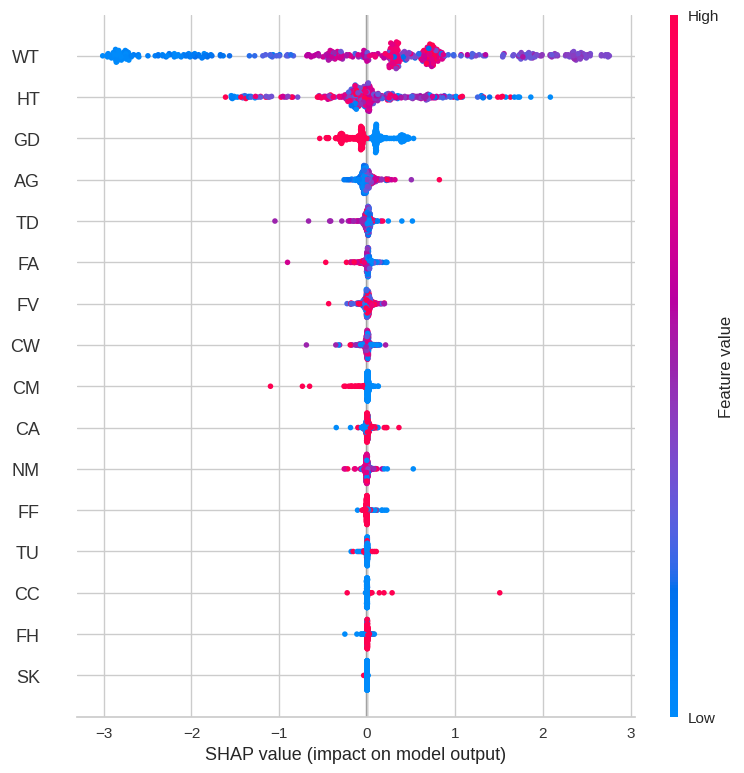

In [148]:
# SHAP Explanations for the best model
explainer = shap.Explainer(best_model.predict, X_train)
shap_values = explainer(X_test)
shap.summary_plot(shap_values, X_test)

In [155]:
# LIME Explanations for the best model
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=X_train.columns,
    class_names=['Obesity_Type_I','Not Obesity_Type_I'],
    mode='classification'
)

# Example explanation for a single instance
i =5
explanation = explainer.explain_instance(X_test.iloc[i], best_model.predict_proba, num_features=5)
explanation.show_in_notebook()